<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/World_Happiness_Report_(2015_2024)_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d adilshamim8/world-happiness-report-2015-2024

# Unziping the downloaded file
!unzip world-happiness-report-2015-2024.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/adilshamim8/world-happiness-report-2015-2024
License(s): CC0-1.0
  0% 0.00/58.9k [00:00<?, ?B/s]
100% 58.9k/58.9k [00:00<00:00, 203MB/s]
Archive:  world-happiness-report-2015-2024.zip
  inflating: 2015.csv                
  inflating: 2016.csv                
  inflating: 2017.csv                
  inflating: 2018.csv                
  inflating: 2019.csv                
  inflating: 2020.csv                
  inflating: 2021.csv                
  inflating: 2022.csv                
  inflating: 2023.csv                
  inflating: 2024.csv                


In [4]:
import glob

csv_files = glob.glob('*.csv')

dataframes = []

for file in csv_files:
    df = pd.read_csv(file)
    dataframes.append(df)

combined_df = pd.concat(dataframes, ignore_index=True)

combined_df.head()

,Country name,Happiness Rank,Happiness score,Upperwhisker,Lowerwhisker,Economy (GDP per Capita)\t,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,...,GDP per capita,Region,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Health (Life Expectancy),Trust (Government Corruption),Dystopia Residual,Standard Error
0,Finland,1.0,7.804,7.875,7.733,1.888,1.585,0.535,0.772,0.126,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Denmark,2.0,7.586,7.667,7.506,1.949,1.548,0.537,0.734,0.208,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Iceland,3.0,7.530,7.625,7.434,1.926,1.620,0.559,0.738,0.250,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Israel,4.0,7.473,7.535,7.411,1.833,1.521,0.577,0.569,0.124,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Netherlands,5.0,7.403,7.460,7.346,1.942,1.488,0.545,0.672,0.251,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
combined_df.shape

(1510, 35)

In [6]:
combined_df.columns

Index(['Country name', 'Happiness Rank', 'Happiness score', 'Upperwhisker',
       'Lowerwhisker', 'Economy (GDP per Capita)\t', 'Social support',
       'Healthy life expectancy', 'Freedom to make life choices', 'Generosity',
       'Perceptions of corruption', 'Country', 'Happiness.Rank',
       'Happiness.Score', 'Whisker.high', 'Whisker.low',
       'Economy..GDP.per.Capita.', 'Family', 'Health..Life.Expectancy.',
       'Freedom', 'Trust..Government.Corruption.', 'Dystopia.Residual',
       'Overall rank', 'Country or region', 'Score', 'GDP per capita',
       'Region', 'Happiness Score', 'Lower Confidence Interval',
       'Upper Confidence Interval', 'Economy (GDP per Capita)',
       'Health (Life Expectancy)', 'Trust (Government Corruption)',
       'Dystopia Residual', 'Standard Error'],
      dtype='object')

In [7]:
combined_df.dtypes

,0
Country name,object
Happiness Rank,float64
Happiness score,float64
Upperwhisker,float64
Lowerwhisker,float64
Economy (GDP per Capita)\t,float64
Social support,float64
Healthy life expectancy,float64
Freedom to make life choices,float64
Generosity,float64


In [9]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1510 entries, 0 to 1509
Data columns (total 35 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country name                   728 non-null    object 
 1   Happiness Rank                 1043 non-null   float64
 2   Happiness score                728 non-null    float64
 3   Upperwhisker                   728 non-null    float64
 4   Lowerwhisker                   728 non-null    float64
 5   Economy (GDP per Capita)	      725 non-null    float64
 6   Social support                 1037 non-null   float64
 7   Healthy life expectancy        1036 non-null   float64
 8   Freedom to make life choices   1037 non-null   float64
 9   Generosity                     1507 non-null   float64
 10  Perceptions of corruption      1036 non-null   float64
 11  Country                        470 non-null    object 
 12  Happiness.Rank                 155 non-null    f

In [12]:
combined_df.isnull().sum()

,0
Country name,782
Happiness Rank,467
Happiness score,782
Upperwhisker,782
Lowerwhisker,782
Economy (GDP per Capita)\t,785
Social support,473
Healthy life expectancy,474
Freedom to make life choices,473
Generosity,3


# Handling Missing Values

In [15]:
# Identifying numerical and categorical columns
numerical_cols = combined_df.select_dtypes(include=np.number).columns
categorical_cols = combined_df.select_dtypes(include='object').columns

# For numerical columns, we might impute with the mean or median
for col in numerical_cols:
    if combined_df[col].isnull().any():
        combined_df[col].fillna(combined_df[col].mean(), inplace=True)

# For categorical columns, we might impute with the mode or a constant
for col in categorical_cols:
    if combined_df[col].isnull().any():
        combined_df[col].fillna(combined_df[col].mode()[0], inplace=True)

print("\nMissing values after handling:")
combined_df.isnull().sum()


Missing values after handling:


,0
Country name,0
Happiness Rank,0
Happiness score,0
Upperwhisker,0
Lowerwhisker,0
Economy (GDP per Capita)\t,0
Social support,0
Healthy life expectancy,0
Freedom to make life choices,0
Generosity,0


In [16]:
combined_df.duplicated().sum()

np.int64(0)

# Univariate Analysis

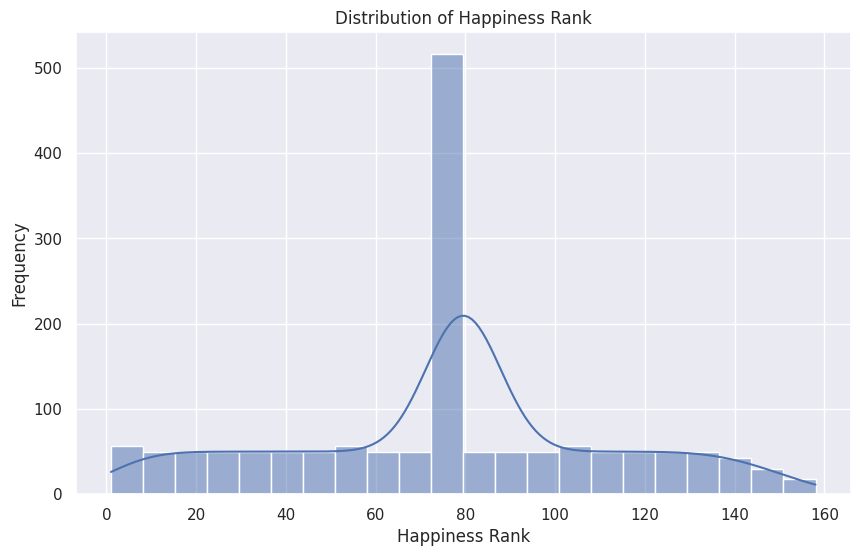

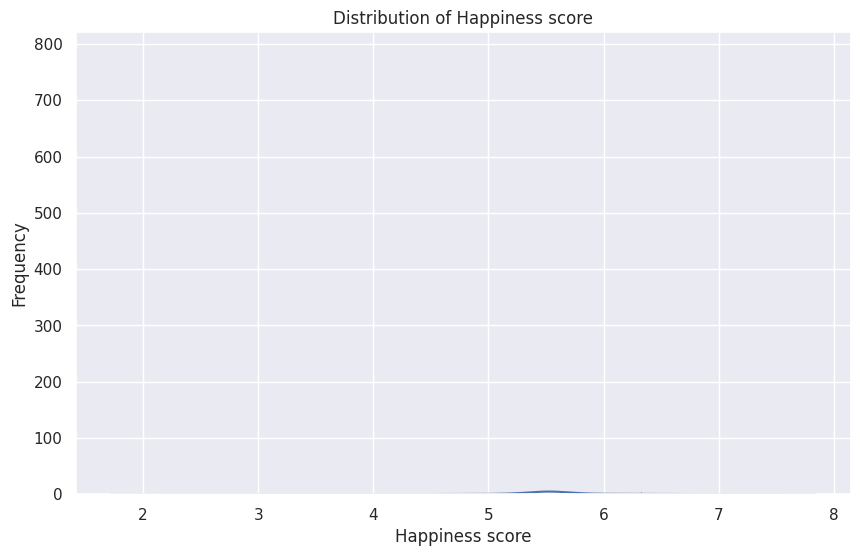

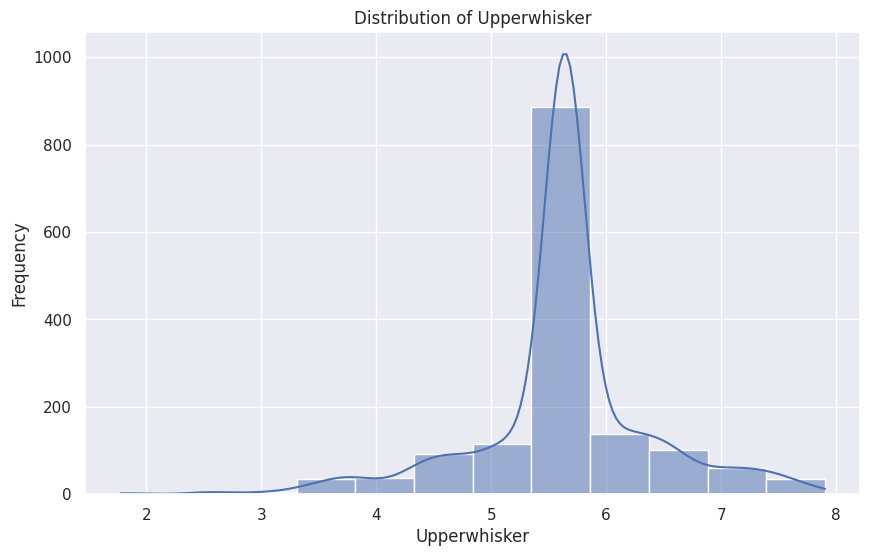

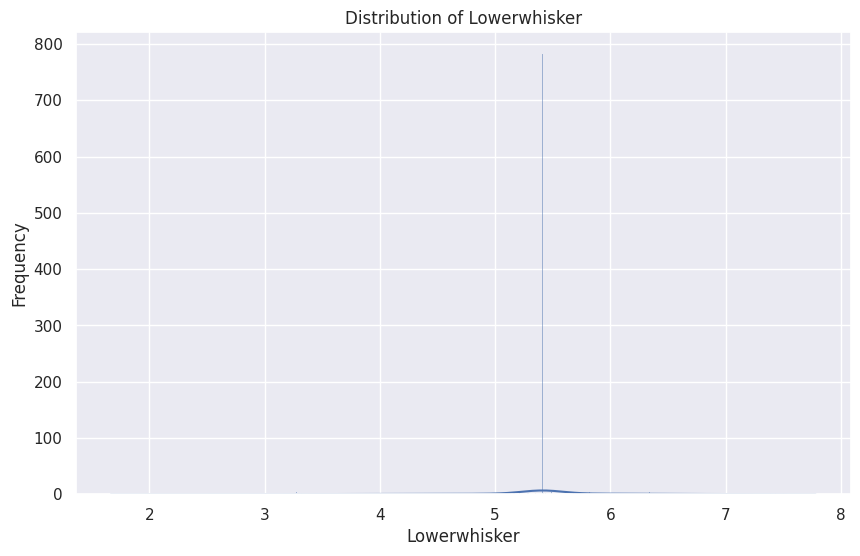

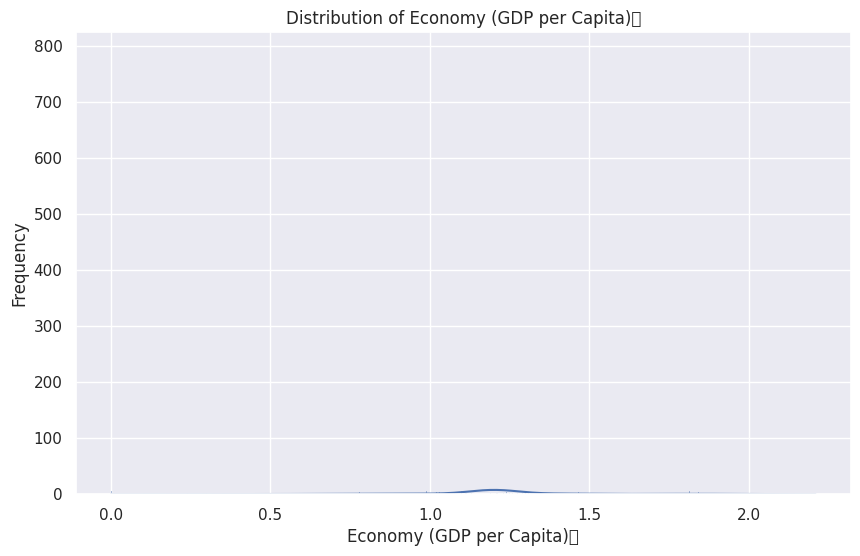

...

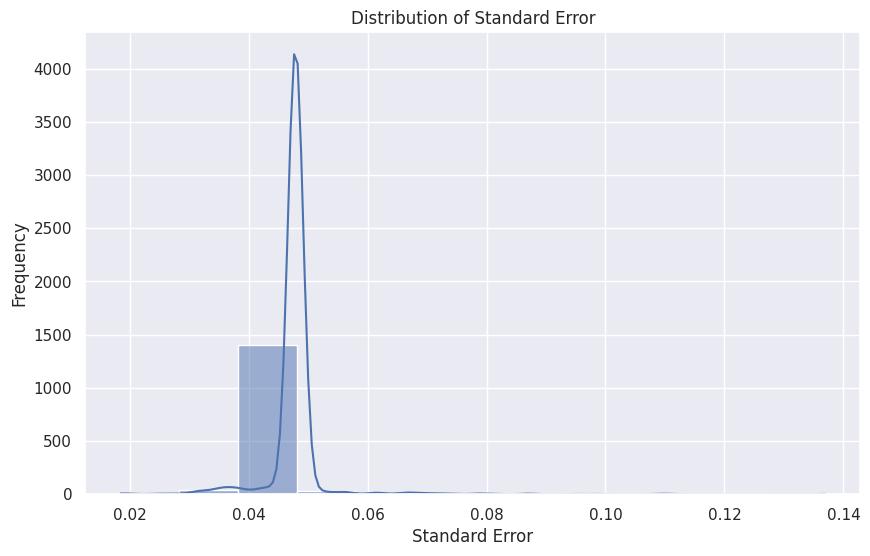

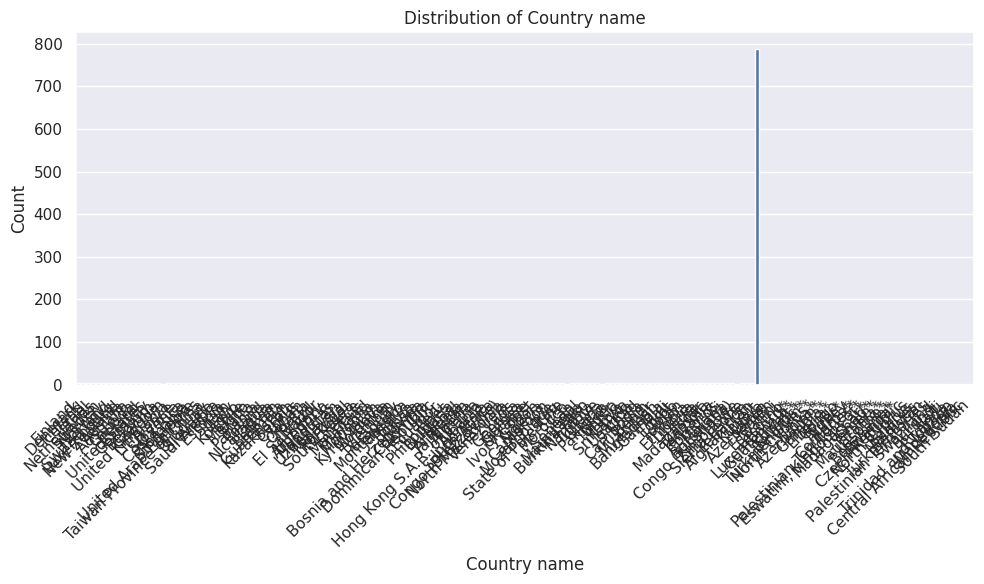

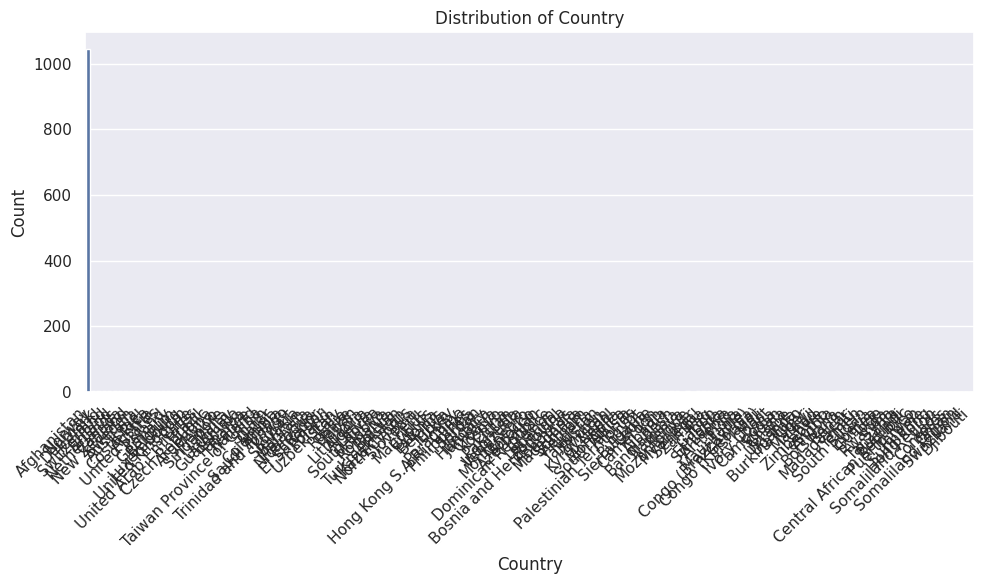

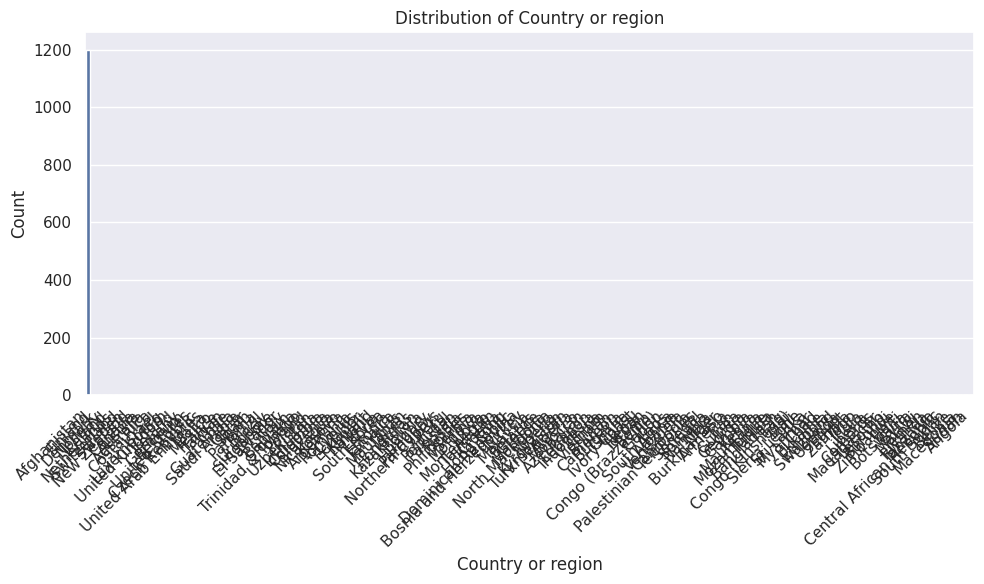

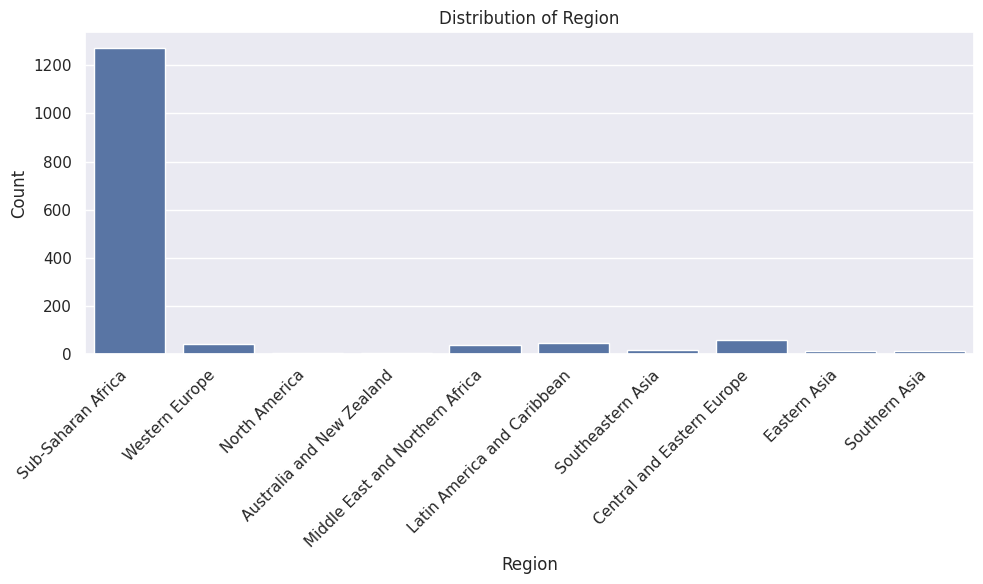

Value counts for Country name:
Country name
Afghanistan                 787
Finland                       5
Iceland                       5
Denmark                       5
Netherlands                   5
                           ... 
Botswana*                     1
Trinidad and Tobago           1
Macedonia                     1
Central African Republic      1
South Sudan                   1
Name: count, Length: 180, dtype: int64

Value counts for Country:
Country
Afghanistan          1043
Norway                  3
Denmark                 3
Iceland                 3
Switzerland             3
                     ... 
Somaliland Region       1
Oman                    1
Somaliland region       1
Swaziland               1
Djibouti                1
Name: count, Length: 166, dtype: int64

Value counts for Country or region:
Country or region
Afghanistan    1200
Finland           2
Denmark           2
Norway            2
Iceland           2
               ... 
Swaziland         1
Belize    

In [18]:
# Getting a list of numerical columns
numerical_cols = combined_df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=combined_df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = combined_df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=combined_df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{combined_df[col].value_counts()}\n")

# Bivariate Analysis

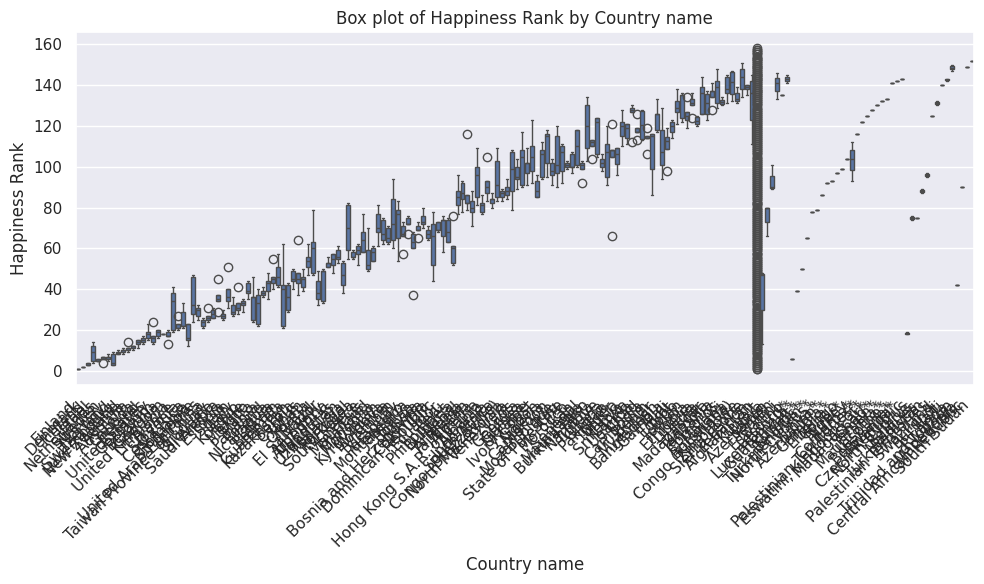

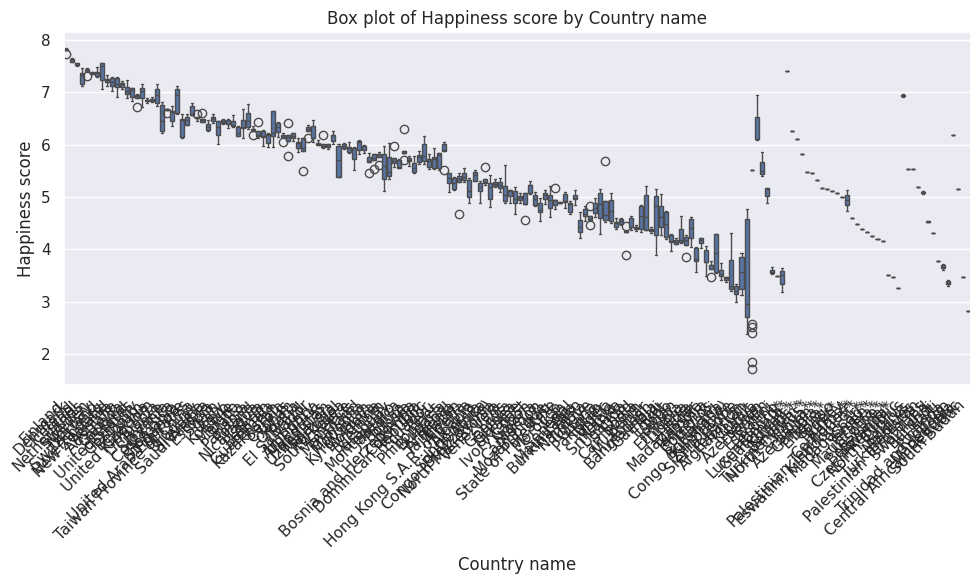

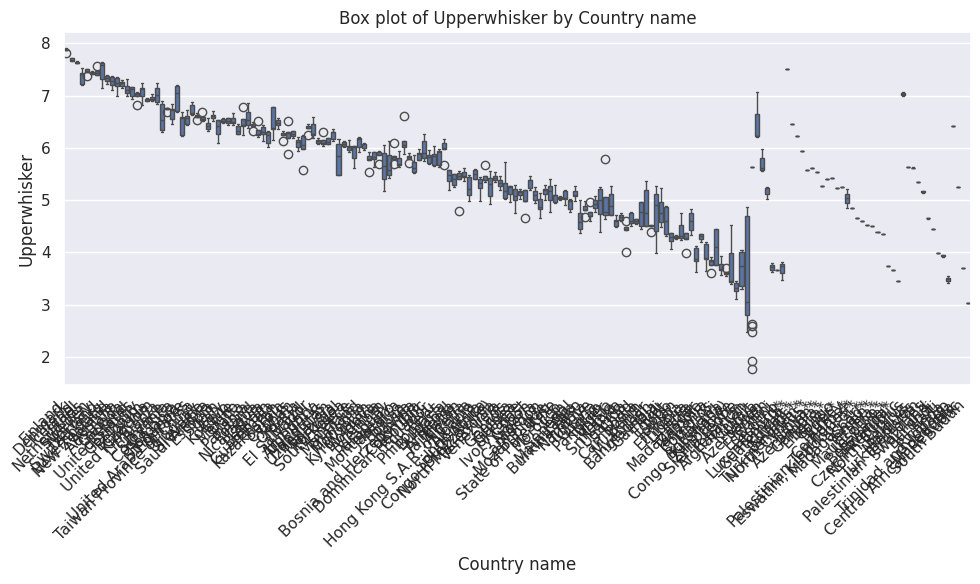

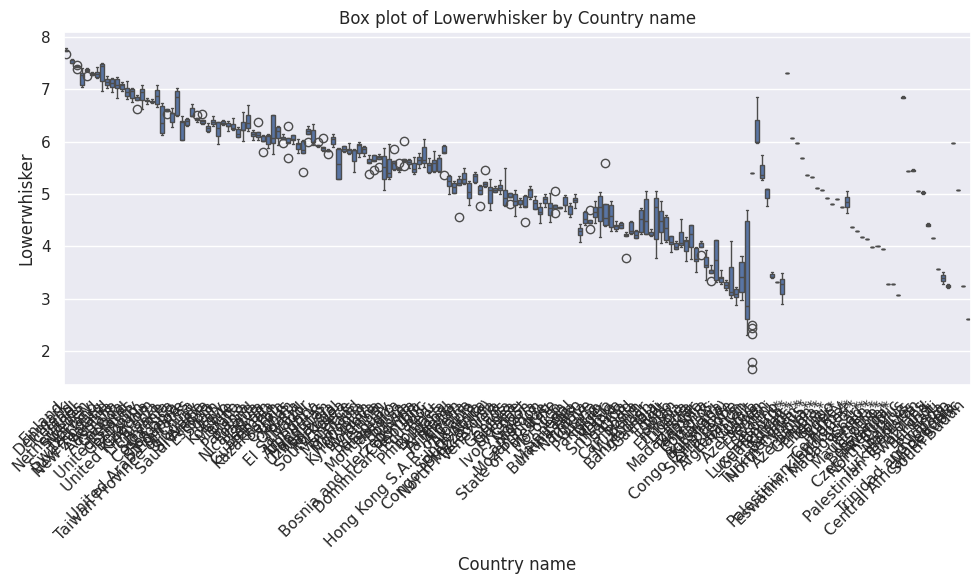

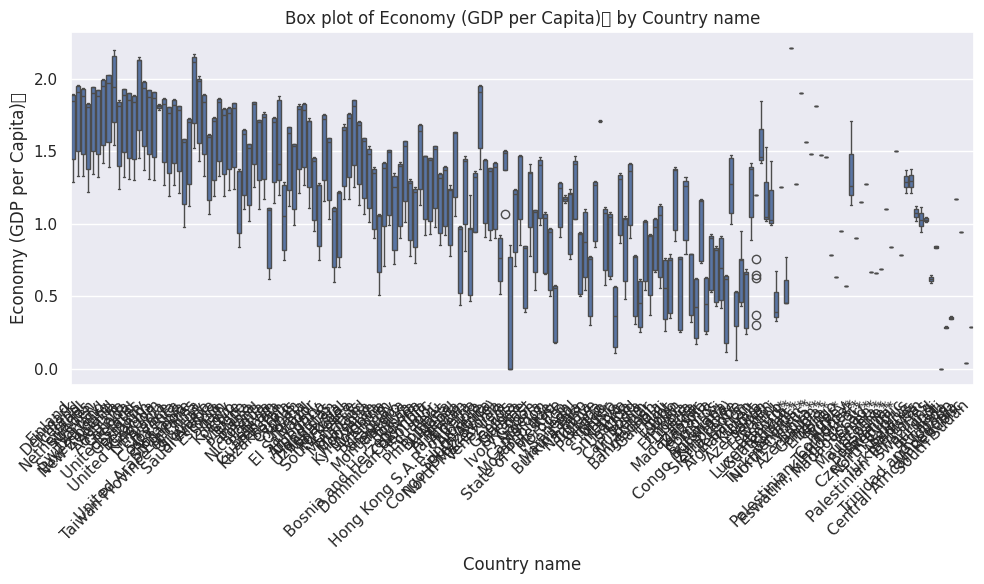

...

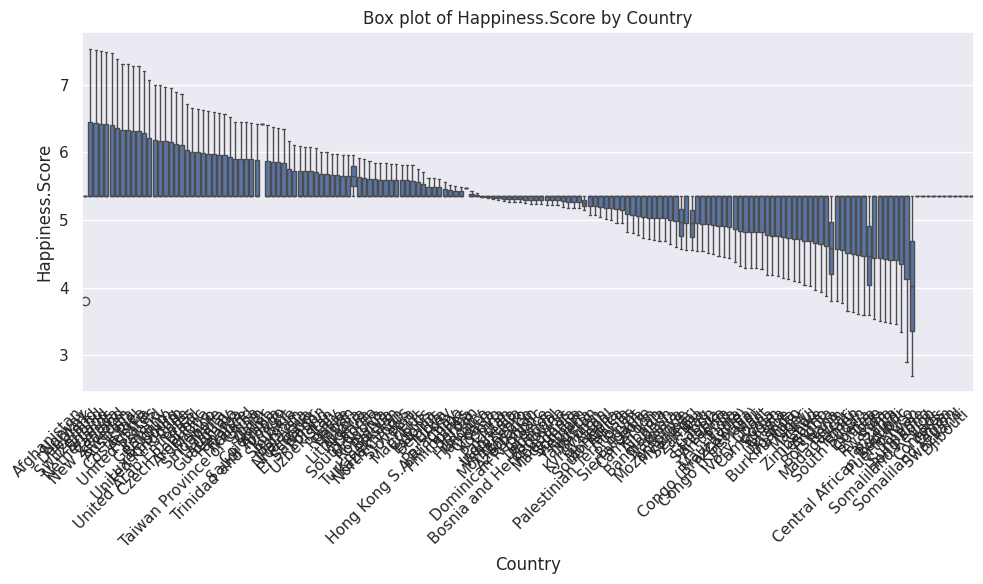

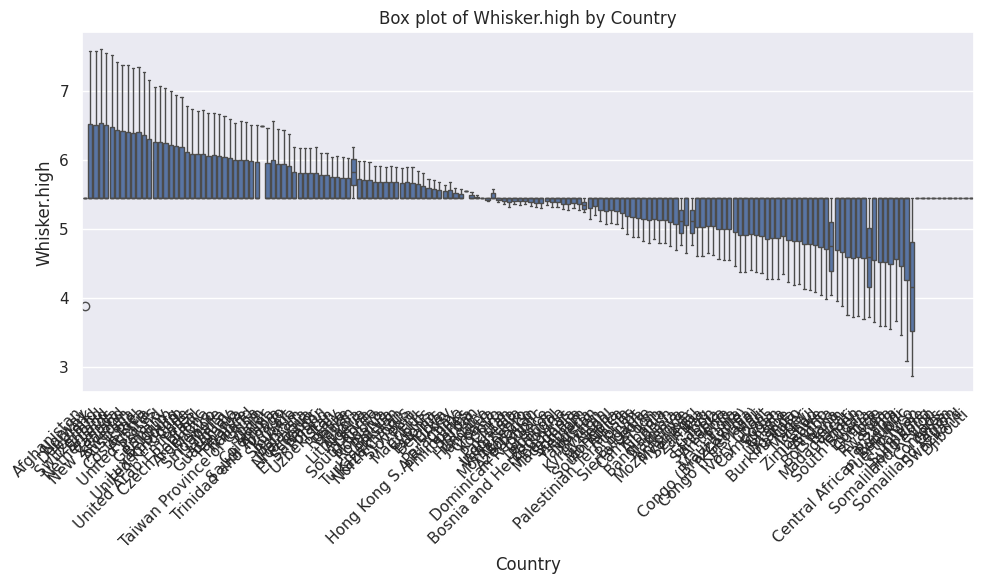

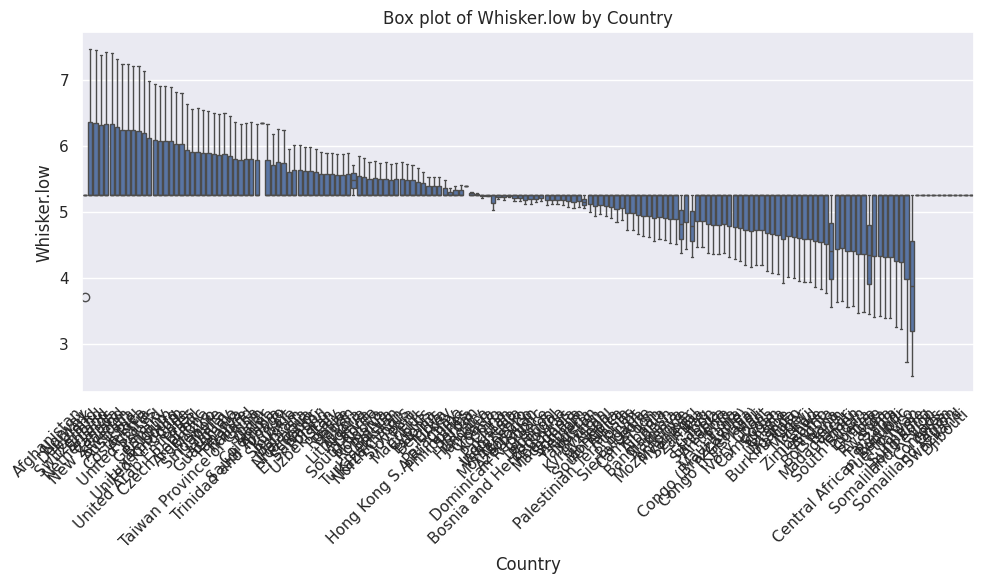

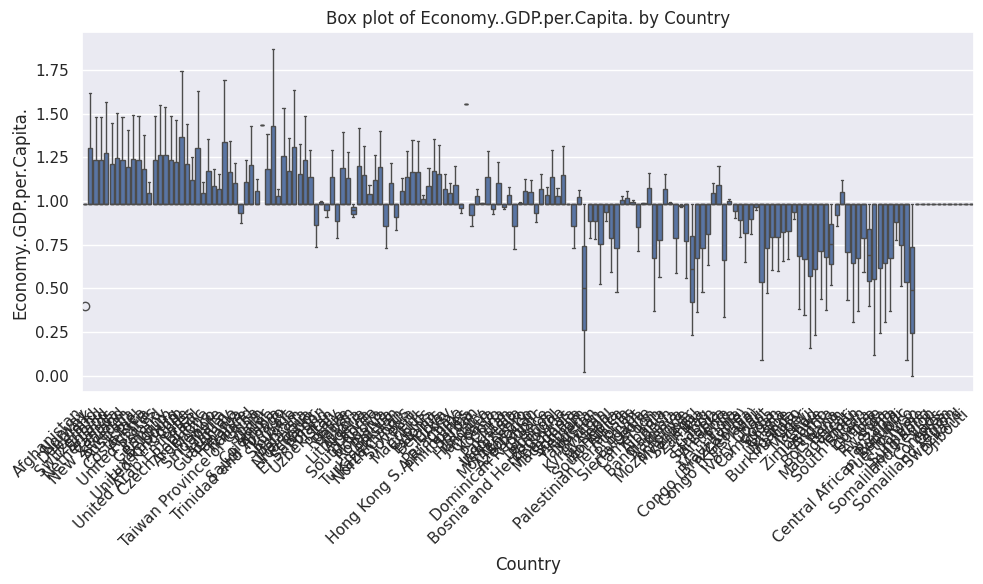

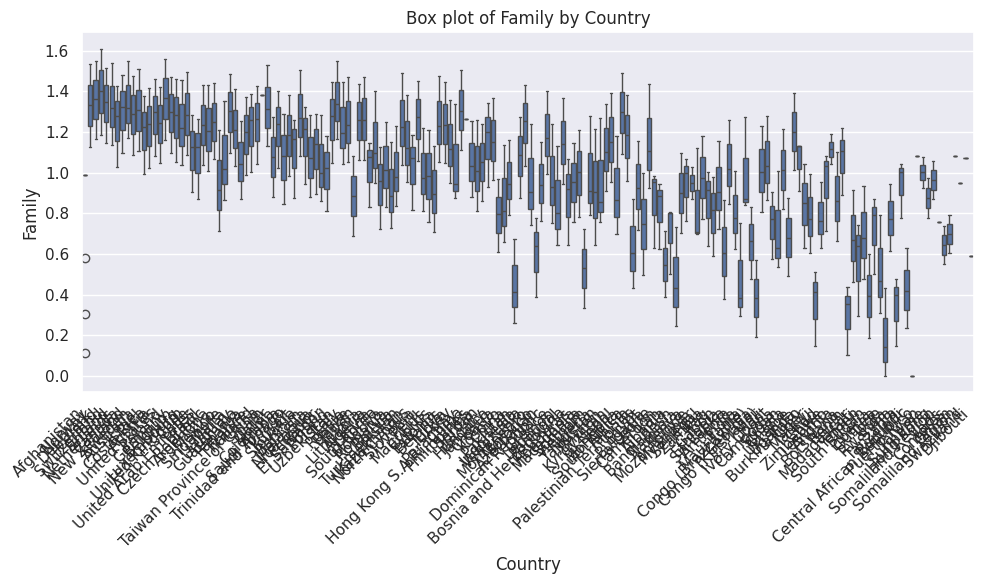

In [ ]:
# Categorical-Numerical relationships (Box plots)
categorical_cols = combined_df.select_dtypes(include='object').columns.tolist()
numerical_cols = combined_df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=combined_df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

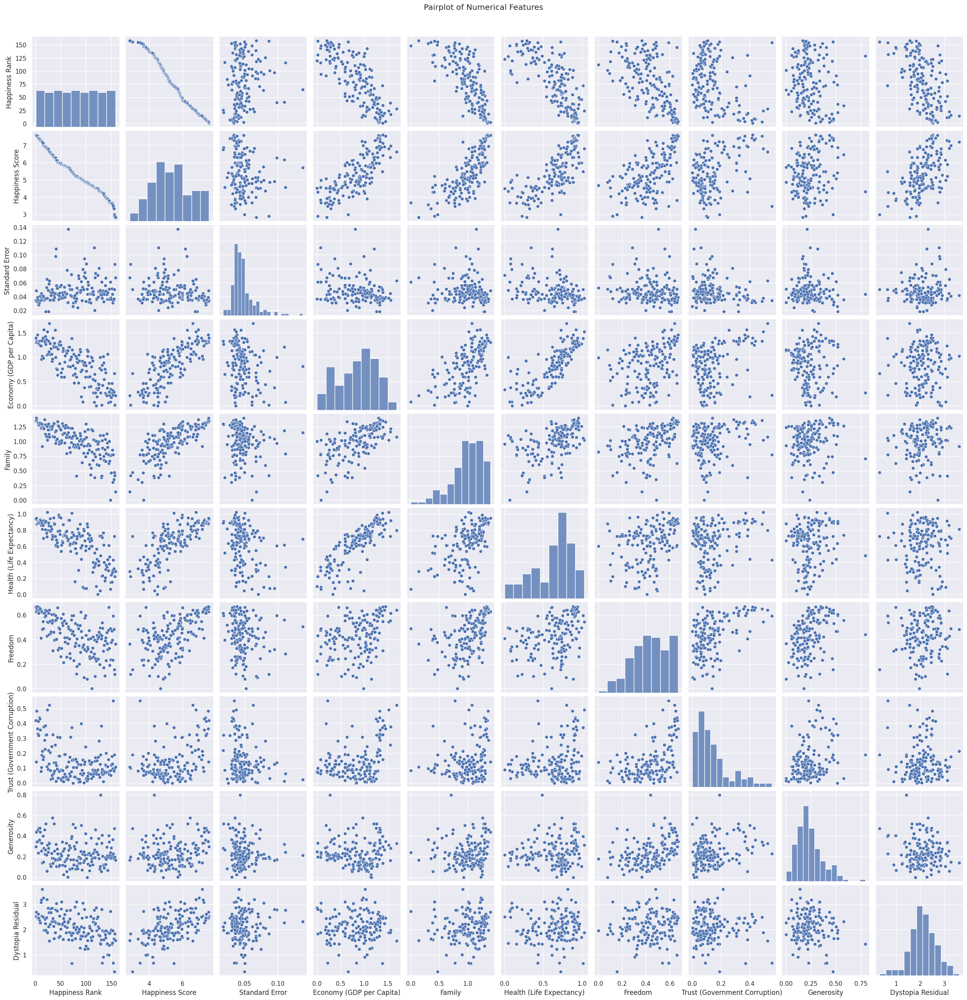

In [20]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

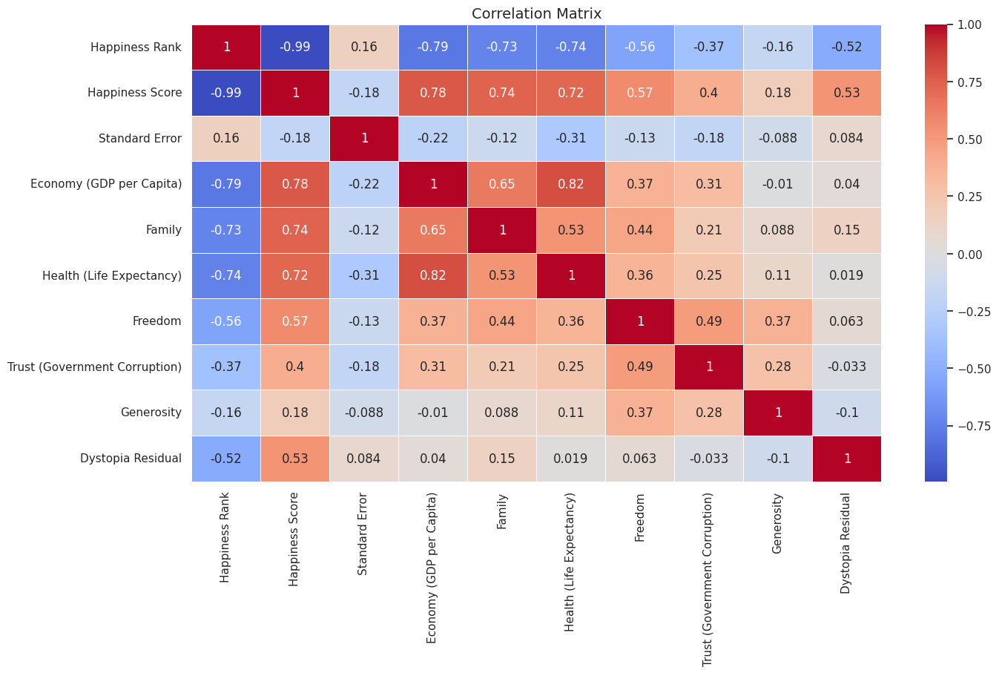

In [21]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank you